In [11]:
# For working with neural networks
from tensorflow.keras.applications import VGG19
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.applications.vgg16 import decode_predictions

# For data processing and plotting
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import random

In [12]:
# load the model
model = VGG19(weights='imagenet', include_top=True)

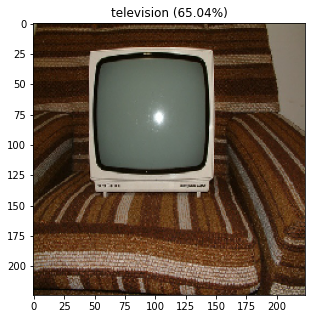

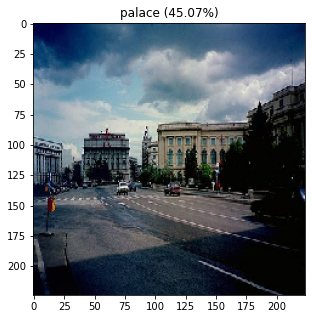

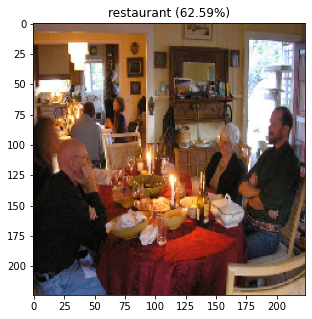

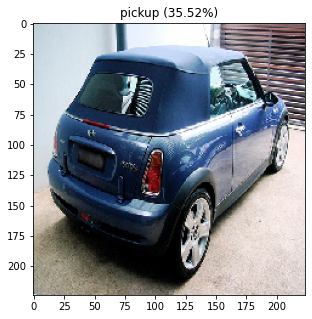

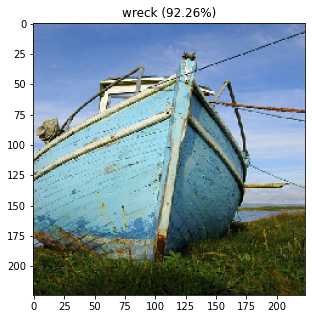

...

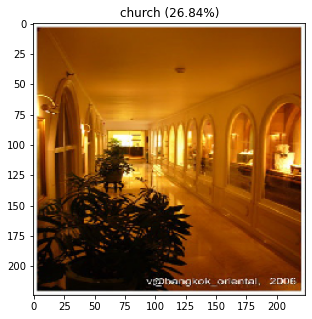

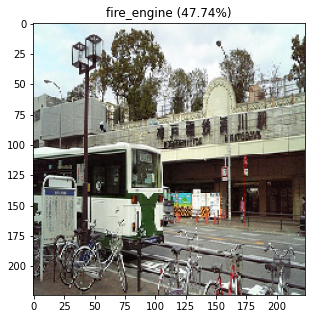

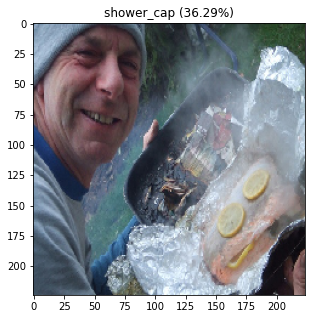

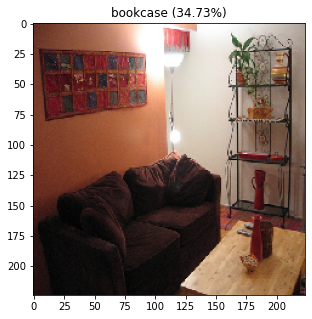

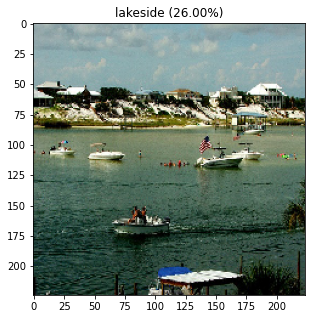

In [36]:
path = "/Users/deepshikhagupta/Downloads/Image Analysis and Computer Vision/VOCdevkit2007/VOC2007/JPEGImages/"
files = os.listdir(path)
for x in range(50):
    index = random.randrange(0, len(files))
    img_path = path+files[index]
    
    # Load image for the model
    img = image.load_img(img_path, target_size=(224, 224))
    
    # convert the image pixels to a numpy array
    x1 = image.img_to_array(img)
    x1 = np.expand_dims(x1, axis=0)
    
    # prepare the image for the VGG model
    x1 = preprocess_input(x1)

    # predict the probability across all output classes
    predictions = model.predict(x1)
    
    # convert the probabilities to class labels
    label = decode_predictions(predictions)
    
    # retrieve the most likely result, e.g. highest probability
    label = label[0][0]
   
    # plot the image and print the classification
    f = plt.figure(figsize=(5,5))
    f.add_subplot(1,1, 1)
    plt.imshow(img),plt.title('%s (%.2f%%)' % (label[1], label[2]*100))
    plt.show(block=True) 